# Sinor Project
## Rice Dectection
In this project, it about classifly rices gain.

In [1]:
import cv2
import math
import time
import numpy as np
import random as rng
import csv
from matplotlib import pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets
from IPython.display import display, HTML,clear_output
%matplotlib inline

## Read File Path

In [2]:
import os, fnmatch
def filePath(path="05.11.61"):
    paths = "assets/" + path + "/"
    pattern = "*[.JPG,.png]"
    list = []
    for file in os.listdir(paths):
        if fnmatch.fnmatch(file, pattern):
            list.append(paths+file)
    return list

## Color Segment

## Auto White Balance

In [3]:
def whiteBalance(img):
    out = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    avg_a = np.average(out[:, :, 1])
    avg_b = np.average(out[:, :, 2])
    out[:, :, 1] = out[:, :, 1] - ((avg_a - 128) * (out[:, :, 0] / 255.0) * 1.1)
    out[:, :, 2] = out[:, :, 2] - ((avg_b - 128) * (out[:, :, 0] / 255.0) * 1.1)
    out = cv2.cvtColor(out, cv2.COLOR_LAB2BGR)
    return out

## Plot Histrogram

In [4]:
def plotHist(inputImage,cvt='rgb',w=False):
    color = (cvt[0],cvt[1],cvt[2])
    data = []
    for i,col in enumerate(color):
        histr = cv2.calcHist([inputImage],[i],None,[256],[0,256])
        plt.plot(histr,color = col)
        data.append(histr)
        plt.xlim([0,256])
    plt.show()
    
#  Write File
    if w :
        myFile = open('example2.csv', 'w')
        with myFile:
            writer = csv.writer(myFile)
            writer.writerows(data)

## Plot Image

In [5]:
global riceImage,riceImageWB,mask
def plotImage(inputImage,path=False):
    inputImageGray = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)
    riceImage = cv2.cvtColor(inputImage,cv2.COLOR_BGR2RGB)
    riceImageWB = whiteBalance(inputImage)
    riceImageWBGray = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2GRAY)
    riceImageWBGray = cv2.blur(riceImageWBGray,(15,15))
    
    _hMin,_sMin,_vMin = 0, 48, 80
    _hMax,_sMax,_vMax = 20, 255, 255
    riceImageHSV = cv2.cvtColor(inputImage,cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(riceImageHSV,(_hMin,_sMin,_vMin),(_hMax,_sMax,_vMax))
    riceOutput = cv2.bitwise_and(riceImage,riceImage,mask = mask)

    plt.figure(figsize=(10,10))
    plt.title('Rice Image')
    plt.imshow(riceImage,cmap='gray')
    plt.show()

    plt.figure(figsize=(10,10))
    plt.title('Rice Image With WhiteBalance')
    riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
    plt.imshow(riceImageWB,cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Segmentation')
    plt.imshow(mask, cmap='gray')
    plt.show()
    
    plt.title('Histogram Of WhiteBalance Rice Image')
    plotHist(riceImageWB)
    if path :
        riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
        cv2.imwrite(path+'_riceWhiteBalance.jpg',riceImageWB)
        cv2.imwrite(path+'_segmentation.jpg',mask)

## Plot Image Throshould

In [6]:
def plotImageByThroshold(inputImage,path=False):
    inputImageGray = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)
    riceImage = cv2.cvtColor(inputImage,cv2.COLOR_BGR2RGB)
    riceImageWB = whiteBalance(inputImage)
    riceImageWBGray = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2GRAY)
#     riceImageWBGray = cv2.blur(riceImageWBGray,(15,15))
    
    mask = cv2.threshold(riceImageWBGray,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # noise removal
    kernel = np.ones((3,3),np.uint8)
    mask = cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernel, iterations = 2)
    # sure background area
    sure_bg = cv2.dilate(mask,kernel,iterations=3)

    riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
    riceOutput = cv2.bitwise_and(riceImageWB,riceImageWB,mask = mask)

    plt.figure(figsize=(10,10))
    plt.title('Rice Image')
    plt.imshow(riceImage,cmap='gray')
    plt.show()

    plt.figure(figsize=(10,10))
    plt.title('Rice Image With WhiteBalance')
    plt.imshow(riceImageWB,cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Segmentation')
    plt.imshow(mask, cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Rice Segment')
    plt.imshow(riceOutput, cmap='gray')
    plt.show()
    
    plt.title('Histogram Of WhiteBalance Rice Image')
    plotHist(riceImageWB)
    if path :
        riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
        riceOutput = cv2.cvtColor(riceOutput, cv2.COLOR_BGR2RGB)
        cv2.imwrite(path[:-4]+'_riceWhiteBalance.jpg',riceImageWB)
        cv2.imwrite(path[:-4]+'_segmentation.jpg',mask)
        cv2.imwrite(path[:-4]+'_riceSegmentation.jpg',riceOutput)

## Color Correction

Avg color [168.74291008 155.03096214 161.05079481]


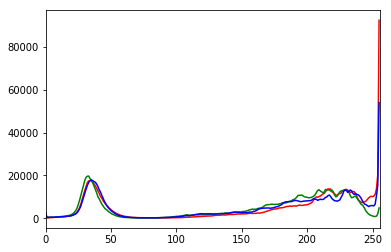

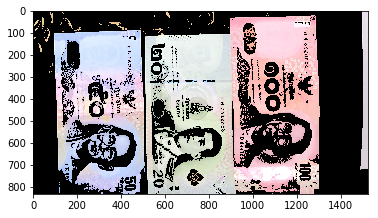

[247. 191. 192.] [-0.  0.  0.] [240. 230. 235.] [202. 213. 247.] [214. 213. 205.]


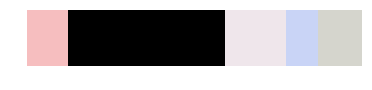

Red is  [247. 191. 192.]
Green is  [202. 213. 247.]
Blue is  [202. 213. 247.]


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def avgColor(img):
    avg_img = np.array(img)
    avg_color_per_row = np.average(avg_img, weights=(avg_img > 0), axis=0)
    avg_color = np.average(avg_color_per_row, axis=0)
    print('Avg color',avg_color)
    return avg_color

def find_histogram(clt):
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins=numLabels)

    hist = hist.astype("float")
    hist /= hist.sum()

    return hist
def plot_bar(hist, centroids):
    bar = np.zeros((50, 300, 3), dtype="uint8")
    start = 0
    colorList = []
    for (percent, color) in zip(hist, centroids):
        x = np.around(color)
        x.astype(int)
        colorList.append(x)
        end = start + (percent * 300)
        cv2.rectangle(bar, (int(start), 0), (int(end), 50),
                      color.astype("uint8").tolist(), -1)
        start = end
    color1, color2, color3, color4, color5 = colorList
    print(color1, color2, color3, color4, color5)
    sumList = np.sum(colorList, axis=1)
    maxIndex = np.argmax(sumList)
    minIndex = np.argmin(sumList)
    colorList.pop(maxIndex)
    colorList.pop(minIndex)
    refRBGs = colorList
    return [bar, refRBGs]

img = cv2.imread(filePath()[2])
img = img[3200:,1500:,...]
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

avg_color = avgColor(img)

plotHist(img,cvt='rgb',w=False)
imgGray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
mask = cv2.threshold(imgGray,190,255,cv2.THRESH_BINARY)[1]
img = cv2.bitwise_and(img, img, mask=mask)
plt.imshow(img)
plt.show()

img = img.reshape((img.shape[0] * img.shape[1],3)) #represent as row*column,channel number
clt = KMeans(n_clusters=5) #cluster number
clt.fit(img)

hist = find_histogram(clt)
bar, RGBs = plot_bar(hist, clt.cluster_centers_)
r, g, b = np.argmax(RGBs, axis=0)

plt.axis("off")
plt.imshow(bar)
plt.show()

print('Red is ', RGBs[r])
print('Green is ', RGBs[g])
print('Blue is ', RGBs[b])

Avg color [168.74291008 155.03096214 161.05079481]


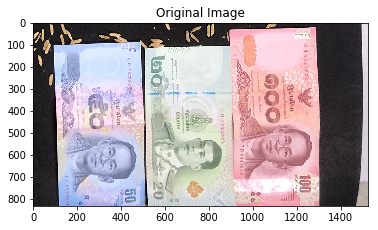

RGBFactor =  [1.         1.04747096 0.99574302]
255
248
255 255 255 267.105094855357


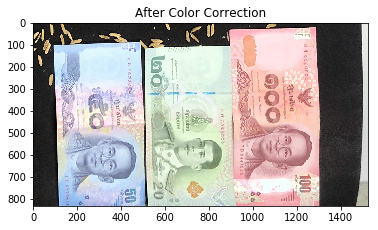

Avg color [135.42035176 130.32233027 128.69703689]


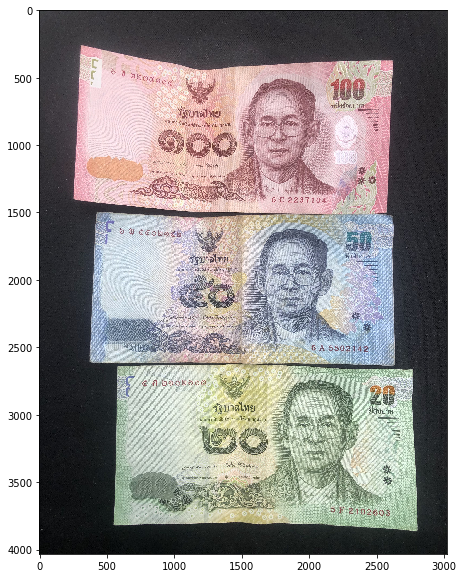

CPU times: user 2.42 s, sys: 332 ms, total: 2.75 s
Wall time: 2.68 s


In [111]:
%%time
def colorCorrection(img, avgRGB):
    plt.title('Original Image')
    plt.imshow(img)
    plt.show()
#     RGBBase = np.array([196,184,169])
    RGBBase = np.array([135.42035176,130.32233027,128.69703689])
    RGBRaw = np.array(avgRGB)
    RGBBase = RGBBase/RGBBase[0]
    RGBRaw = RGBRaw/RGBRaw[0]
    RGBFactor = RGBBase/RGBRaw
    print('RGBFactor = ',RGBFactor)
    imgCC = np.array(img)
    # Red
    red = np.copy(imgCC[:,:,0])
    # Green
    greenFactor = RGBFactor[1]
    print(imgCC[:,:,0][750,1000])
    green = imgCC[:,:,1] * greenFactor
    imgCC[:,:,0] = np.where(green > 255, 255/green*red, red)
    print(imgCC[:,:,0][750,1000])
    imgCC[:,:,1] = np.where(green > 255,255, green)
    print(np.max(imgCC[:,:,0]),np.max(imgCC[:,:,1]),np.max(imgCC[:,:,2]),np.max(green))
    # Blue
    blueFactor = RGBFactor[2]
    blue = imgCC[:,:,2] * blueFactor
    imgCC[:,:,2] = np.where(green > 255, 255/green*blue, blue)
    imgCC[:,:,2] = np.where(blue> 255,255, blue)
    plt.title('After Color Correction')
    plt.imshow(imgCC)
    plt.show()

img = cv2.imread(filePath()[2])
img = img[3200:,1500:,...]
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# avgRGB = [168,155,161]
colorCorrection(img,avgColor(img))

img = cv2.imread(filePath('21.02.62')[1])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
avgColor(img)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

## Plot Connected Components

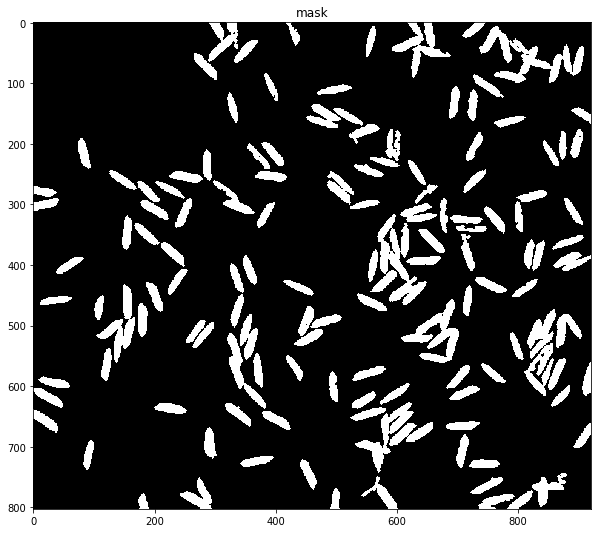

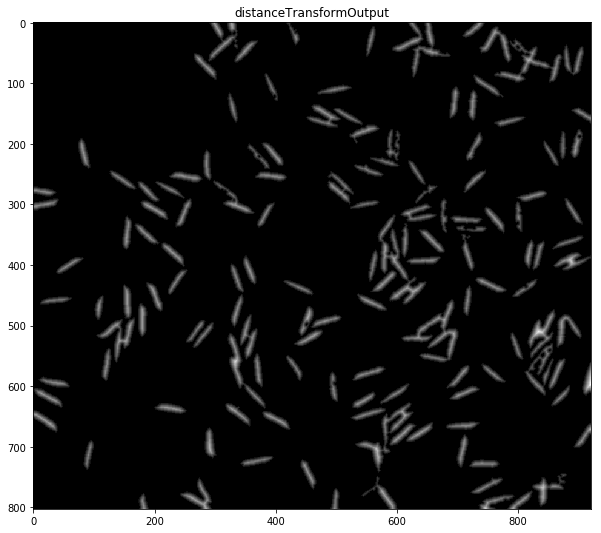

Max Distance: 12.8293


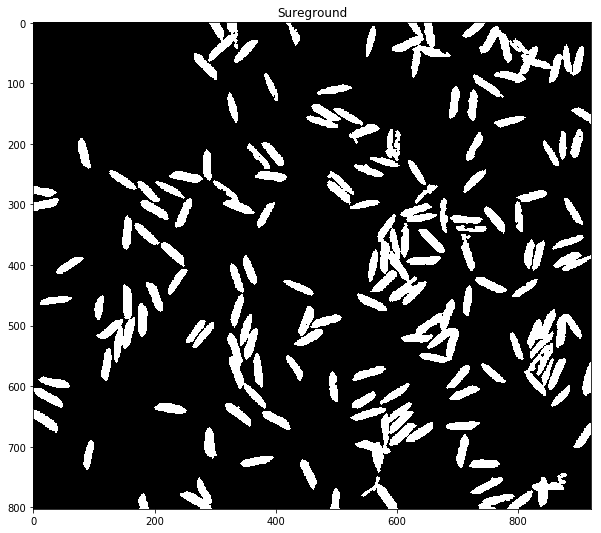

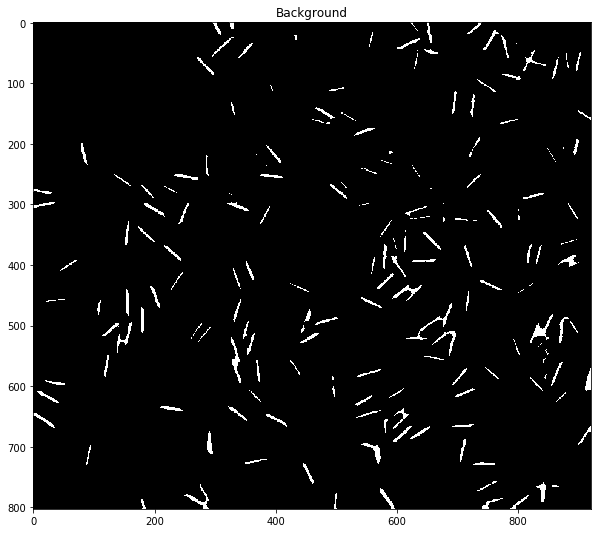

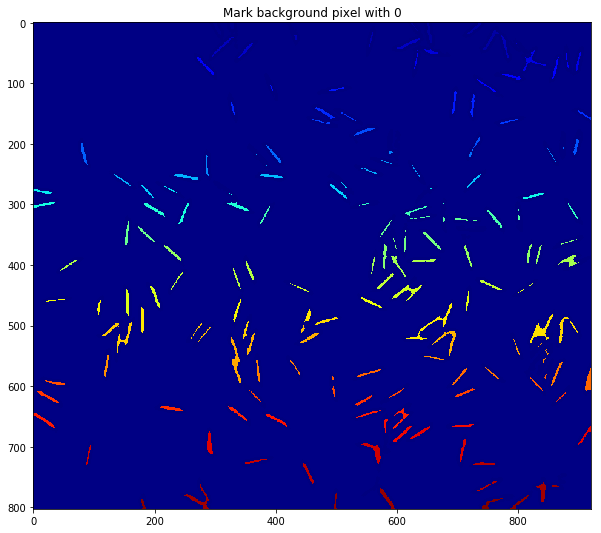

Count: 203


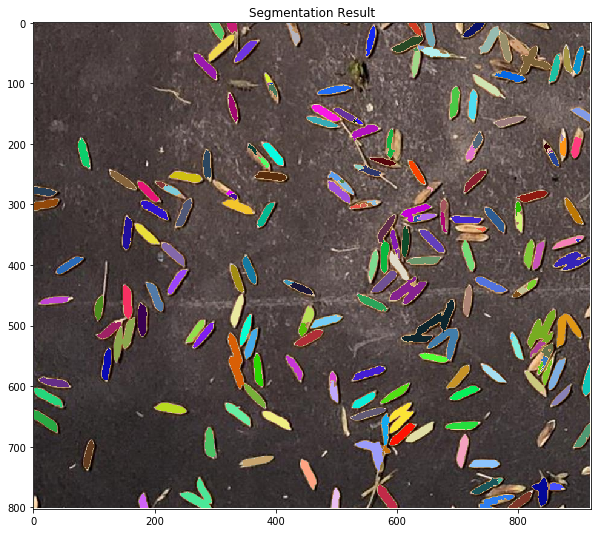

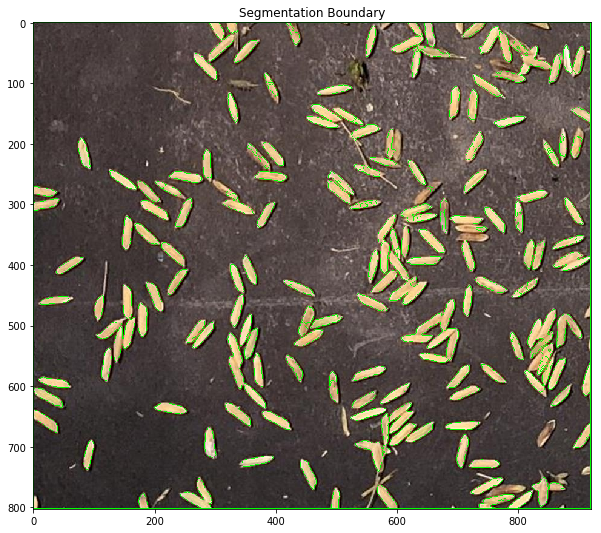

In [9]:
def deleteSmall(inputImg, size):
        nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(inputImg, connectivity=8)
        sizes = stats[1:, -1]; nb_components = nb_components - 1
        
        min_size = size  

        img = np.zeros((inputImg.shape), np.uint8)
        #for every component in the image, you keep it only if it's above min_size
        for i in range(0, nb_components):
            if sizes[i] >= min_size:
                img[output == i + 1] = 255
        return img

def plotConnectedComponents(inputImage):
    cropImage = inputImage
    riceImage = cv2.cvtColor(cropImage,cv2.COLOR_BGR2RGB)
    riceImageGray = cv2.cvtColor(cropImage, cv2.COLOR_BGR2GRAY)

    # noise removal
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(15,15))
    
    opening = cv2.morphologyEx(riceImageGray,cv2.MORPH_OPEN,kernel, iterations = 2)

    I2 = riceImageGray - opening

    mask = cv2.threshold(I2,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    mask2 = cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernel, iterations = 2)

    mask = deleteSmall(mask2, 300)

    plt.figure(figsize=(10,10))
    plt.title('mask')
    plt.imshow(mask,cmap='gray')
    plt.show()
    
    # sure background area
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,1))
    sure_bg = cv2.dilate(mask,kernel,iterations=3)

    riceOutput = cv2.bitwise_and(riceImage,riceImage,mask = mask)
    
    distanceTransformOutput = cv2.distanceTransform(mask,cv2.DIST_L2,3)
    plt.figure(figsize=(10,10))
    plt.title('distanceTransformOutput')
    plt.imshow(distanceTransformOutput,cmap='gray')
    plt.show()
    
    maxDistance = np.max(distanceTransformOutput)
    print('Max Distance:',maxDistance)
    roughMarkerPixel = np.uint8(distanceTransformOutput > 0.4 * maxDistance)
    plt.figure(figsize=(10,10))
    plt.title('Sureground')
    plt.imshow(sure_bg, cmap='gray')
    plt.show()
    
    unknown = cv2.subtract(sure_bg,roughMarkerPixel)
    plt.figure(figsize=(10,10))
    plt.title('Background')
    plt.imshow(roughMarkerPixel, cmap='gray')
    plt.show()
    
    
    _, markers = cv2.connectedComponents(roughMarkerPixel)
    # Add 1 to make the marker label start with 1
    markers = markers+1

    # Mark background pixel with 0
    markers[unknown==255] = 0
    plt.figure(figsize=(10,10))
    plt.title('Mark background pixel with 0')
    plt.imshow(markers,cmap='jet')
    plt.show()
    
    outputImage = cropImage.copy()
    borderImage = cropImage.copy()

    markers = cv2.watershed(outputImage,markers)

    print('Count:',np.max(markers)-1)

    # 1 is background 
    for outputMarkerIdx in range(2,np.max(markers+1)):
        color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
        outputImage[np.where(markers == outputMarkerIdx)] = color
    outputImage = cv2.cvtColor(outputImage,cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,10))
    plt.title('Segmentation Result')
    plt.imshow(outputImage)
    plt.show()
    
    
    borderImage[np.where(markers == -1)] = (0,255,0)
    borderImage = cv2.cvtColor(borderImage,cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.title('Segmentation Boundary')
    plt.imshow(borderImage)
    plt.show()
    
inputImage = cv2.imread(filePath("05.11.61")[4])
plotConnectedComponents(inputImage)

In [10]:
def testImplement(kernelSize1):
    filepath = filePath("05.11.61")[4]
    print(filepath)
    inputImage = cv2.imread(filepath)
    cropImage = inputImage
    cropImageGray = cv2.cvtColor(cropImage, cv2.COLOR_BGR2GRAY)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(15,15))
    opening = cv2.morphologyEx(cropImageGray,cv2.MORPH_OPEN,kernel, iterations = 2)

    I2 = cropImageGray - opening

    mask = cv2.threshold(I2,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    mask2 = cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernel, iterations = 2)
    
    img = deleteSmall(mask2, 300)
    
    stackImg = np.concatenate((mask, img), axis=1)
    
    plt.figure(figsize=(10,10))
    plt.imshow(mask2, cmap = 'gray')
    plt.show()
    plt.figure(figsize=(20,20))
    plt.title('After Opening')
    plt.imshow(stackImg, cmap = 'gray')
    plt.show()
    
    plotConnectedComponents(cropImage)


assets/05.11.61/13.02.62_11.59.jpg


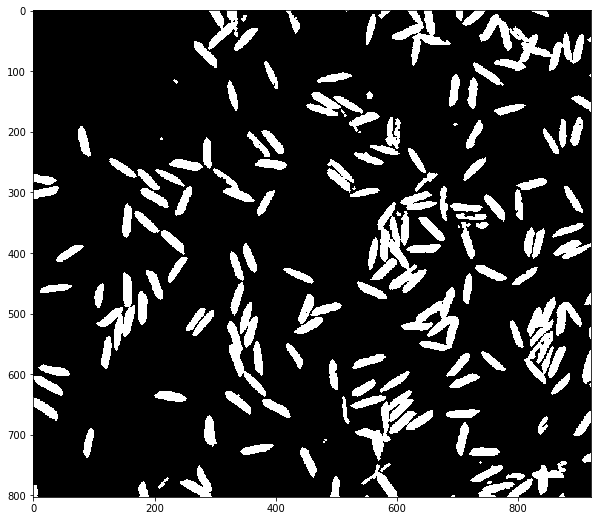

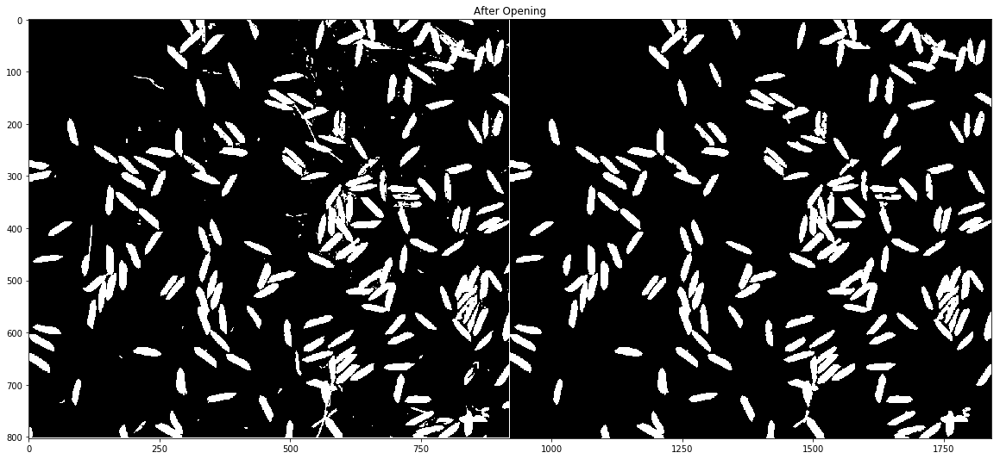

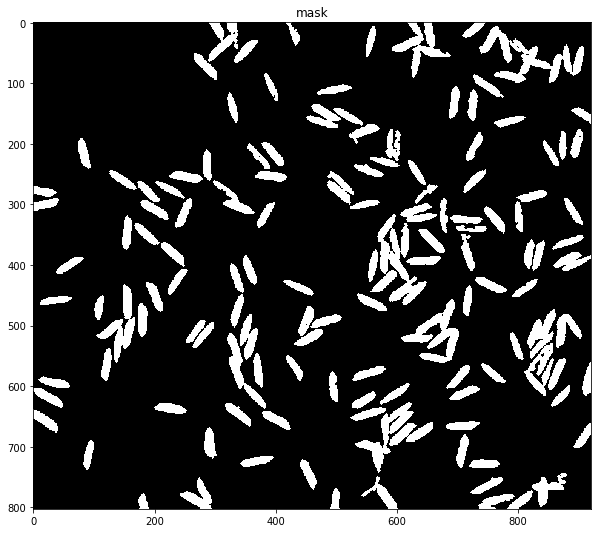

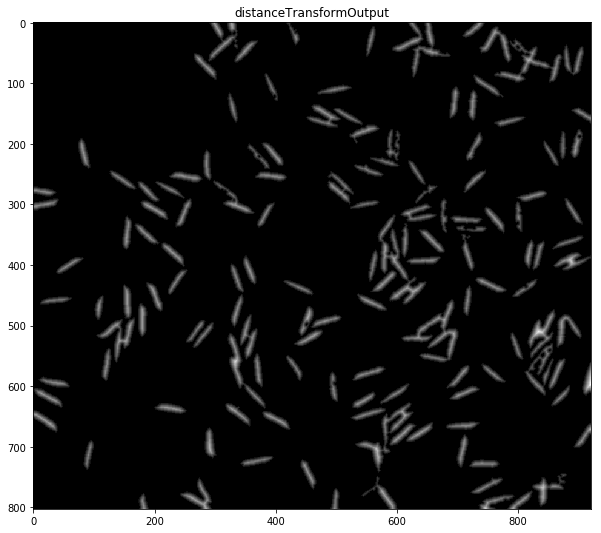

Max Distance: 12.8293


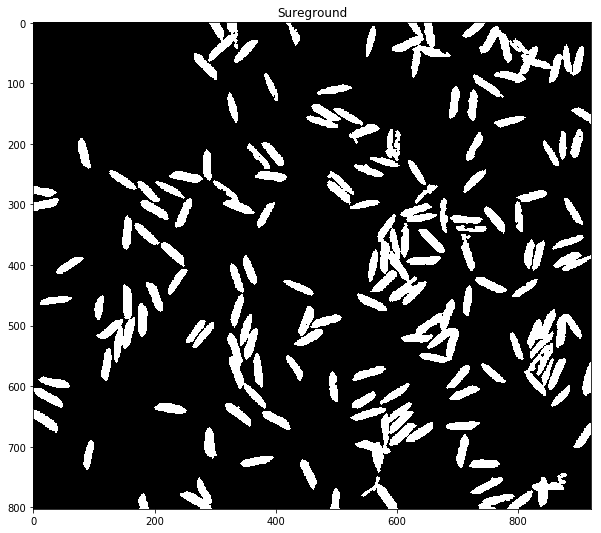

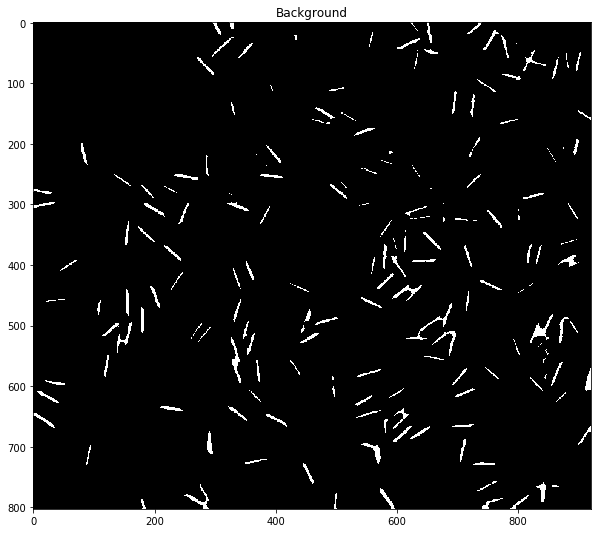

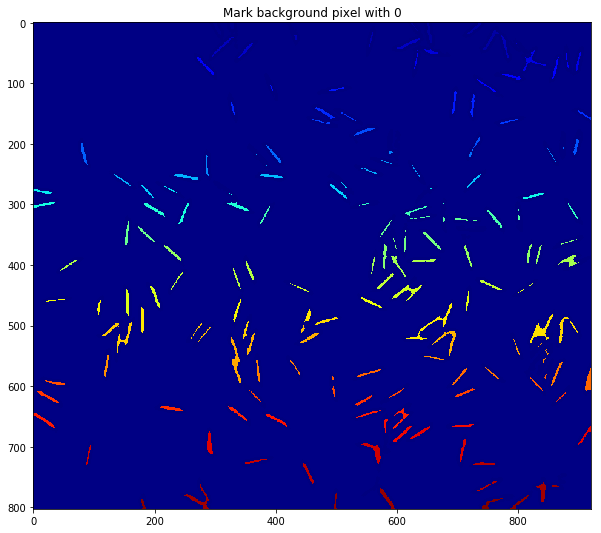

Count: 203


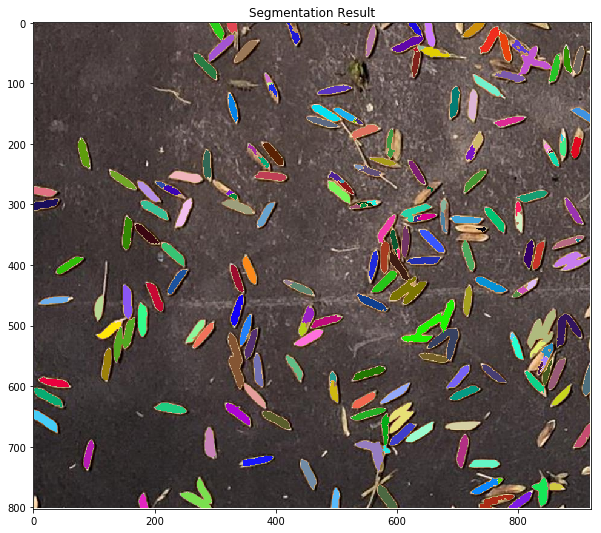

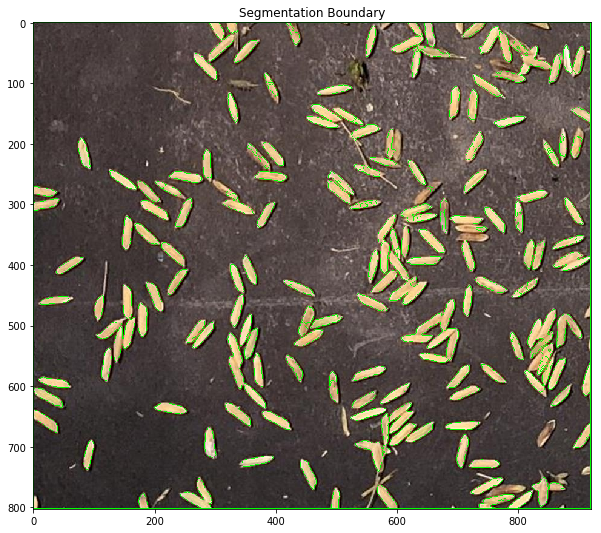

In [11]:
testImplement(3)

## Start Code

['assets/05.11.61/05.11.61_12.09.JPG', 'assets/05.11.61/05.11.61_12.08.JPG', 'assets/05.11.61/05.11.61_12.10.JPG', 'assets/05.11.61/05.11.61_12.07.JPG']


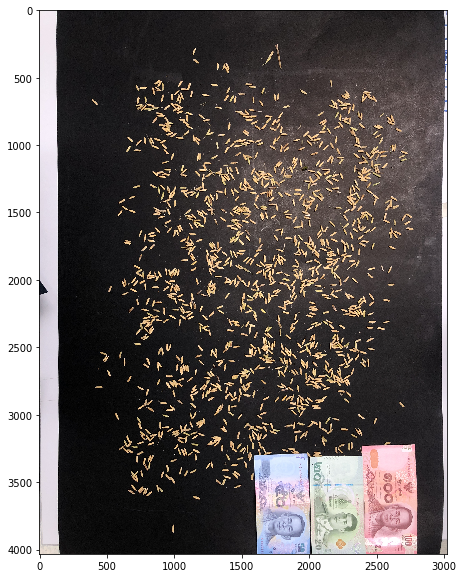

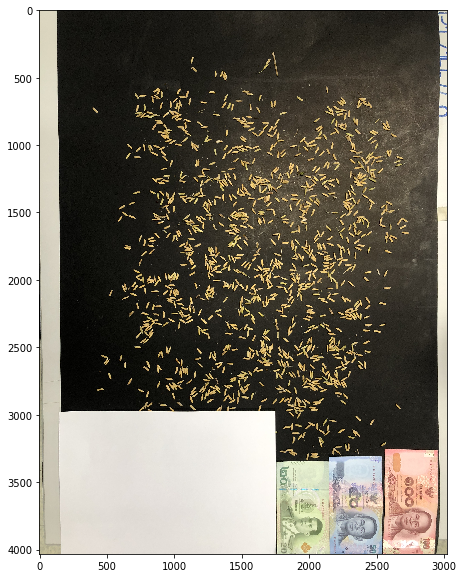

In [121]:
filepath = filePath("05.11.61")[0:4]
print(filepath)
inputImage1 = cv2.imread(filePath()[0])
inputImage1 = cv2.cvtColor(inputImage1, cv2.COLOR_BGR2RGB)
inputImage2 = cv2.imread(filePath()[2])
inputImage2 = cv2.cvtColor(inputImage2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(inputImage1)
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(inputImage2)
plt.show()

## Rice 05.11.61

assets/05.11.61/13.02.62_11.59.jpg


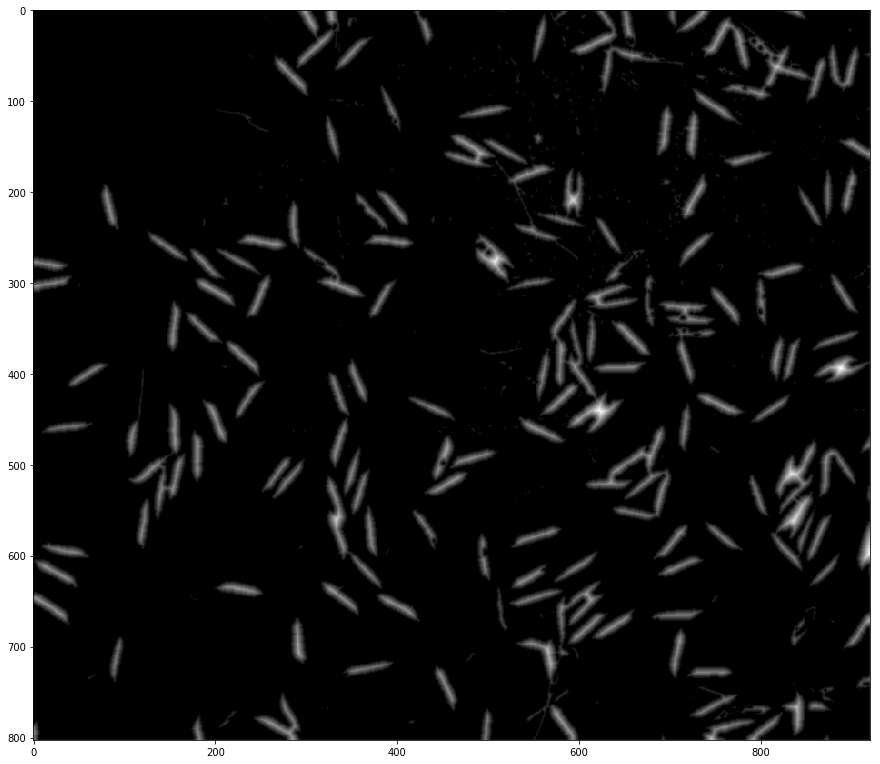

Max Distance: 13.2787


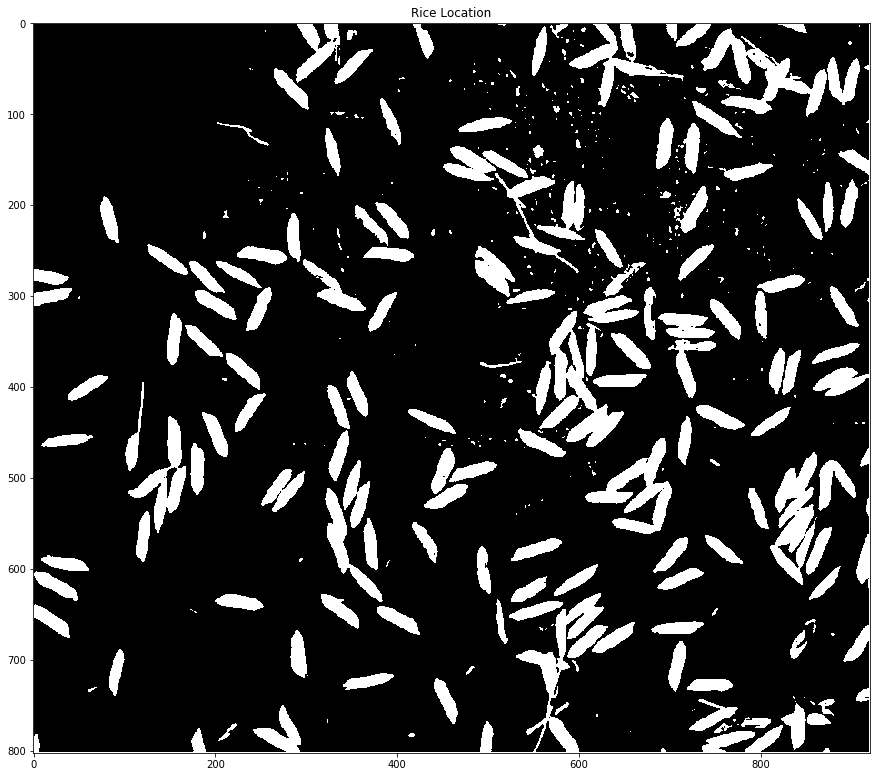

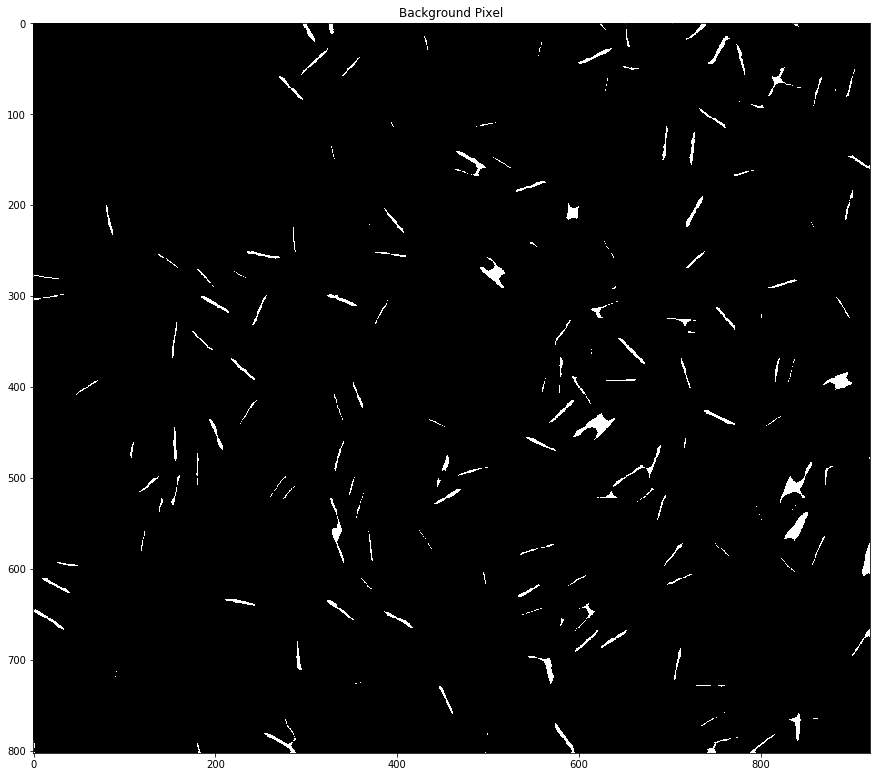

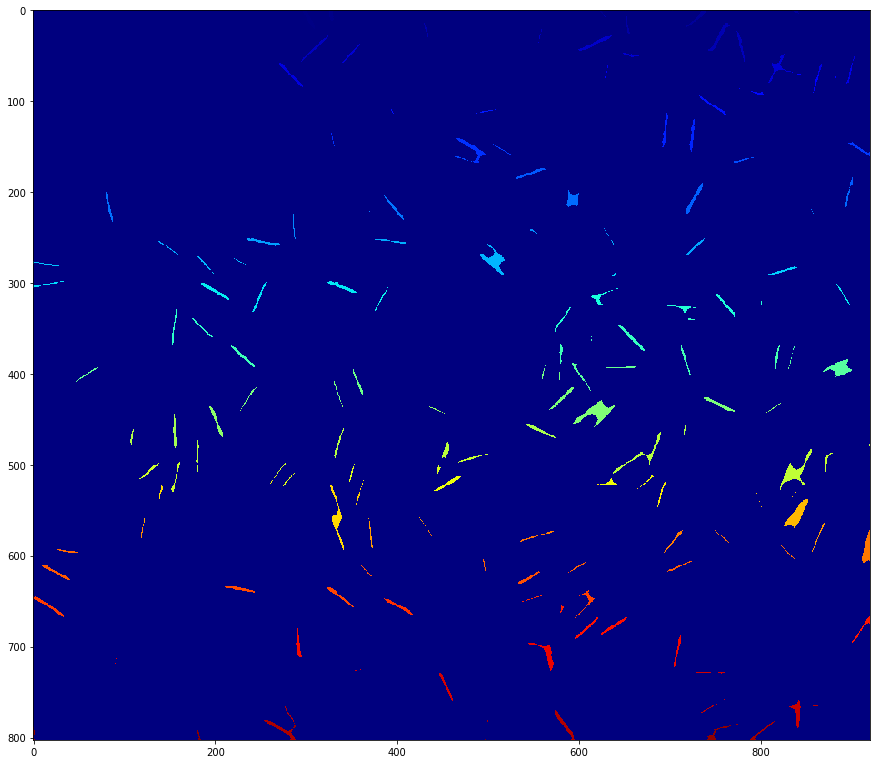

Count: 268


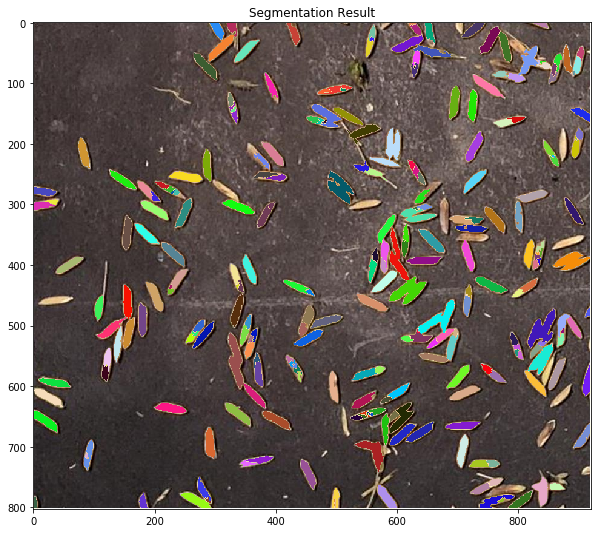

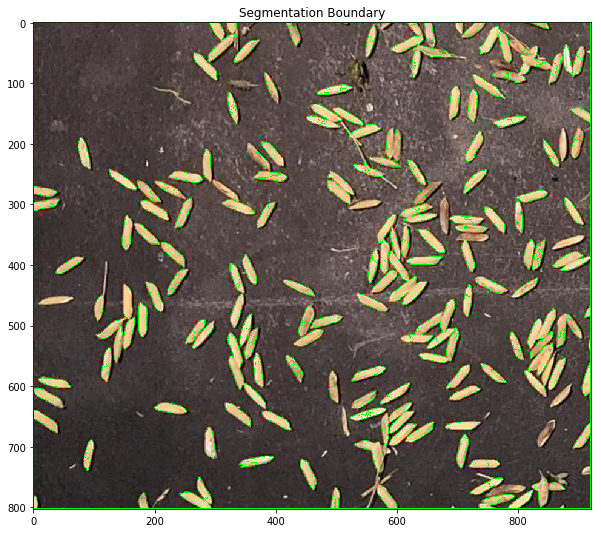

In [37]:
inputImage = cv2.imread(filePath("05.11.61")[4])
print(filePath("05.11.61")[4])
# cropImage = inputImage[250:750,250:750]
cropImage = inputImage
# plotImageByThroshold(cropImage)
plotConnectedComponents(cropImage)
# showImage(cropImage)

## Rice 08.10.61

In [1]:
inputImage = cv2.imread(filePath("08.10.61")[0])
# plotImageByThroshold(inputImage)
plotConnectedComponents(inputImage[200:300,0:400])
# showImage(inputImage)

NameError: name 'cv2' is not defined

## Rice Image White Background Flash ON

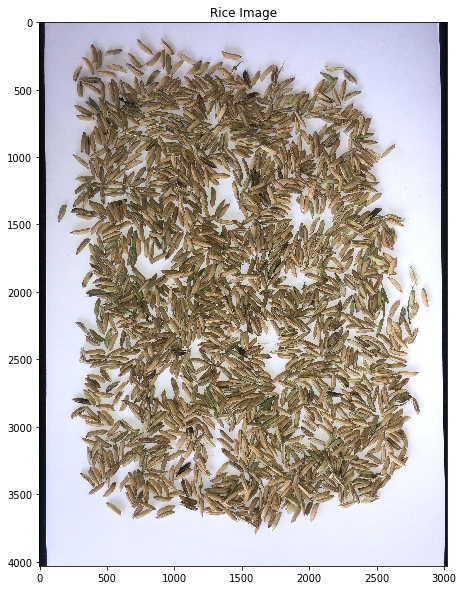

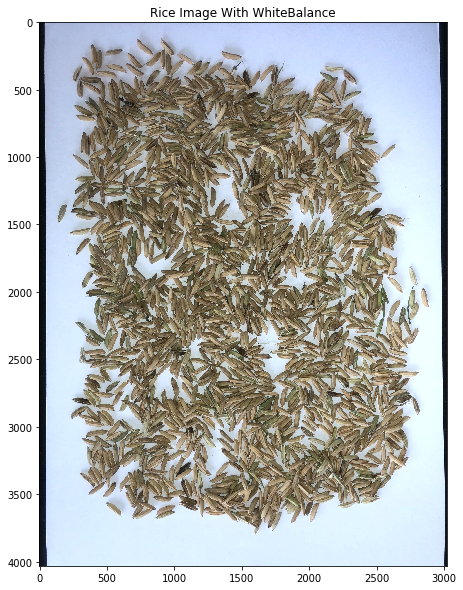

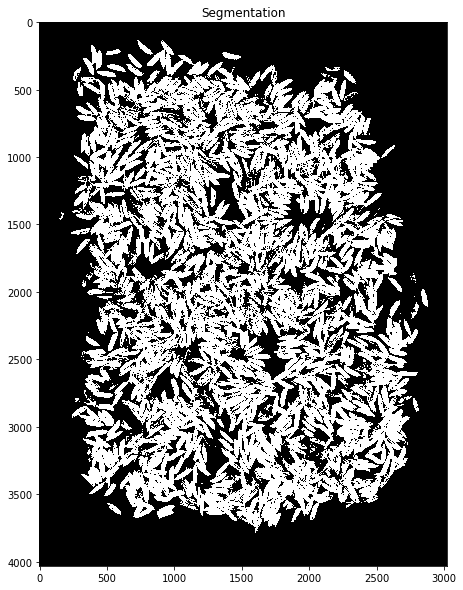

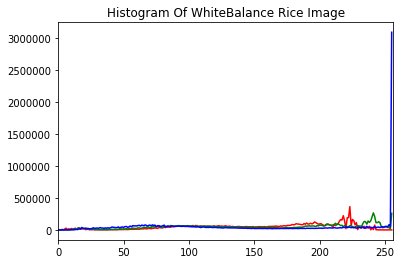

In [13]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.24.jpg")
plotImage(inputImage)
# showImage(inputImage)

## Rice Image White Background Flash OFF

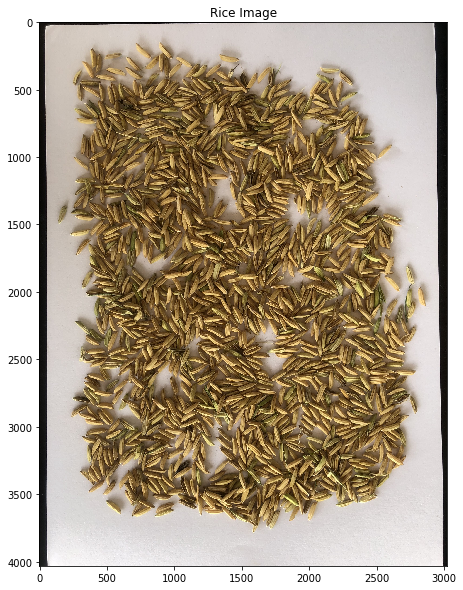

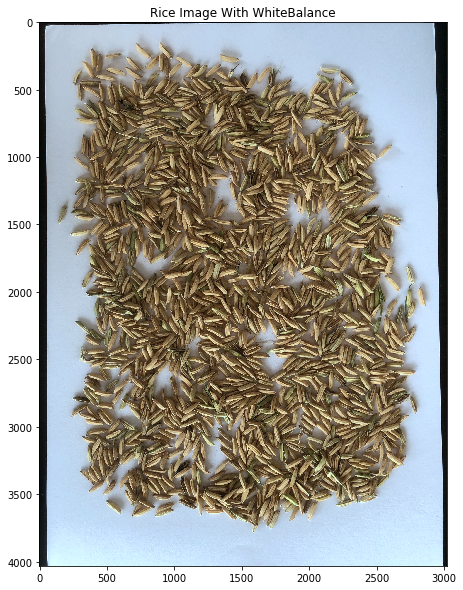

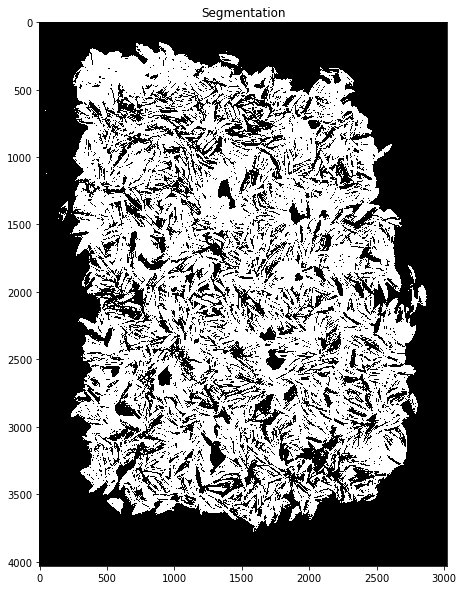

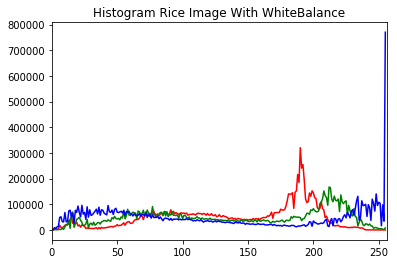

In [30]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.23.jpg")
plotImage(inputImage)
# showImage(inputImage)

## Rice Image Black Background Flash ON

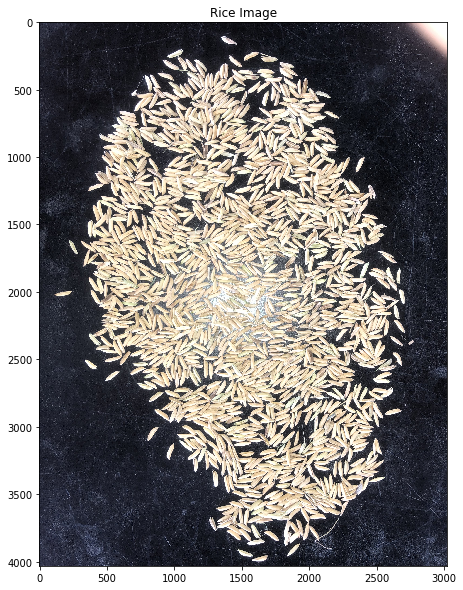

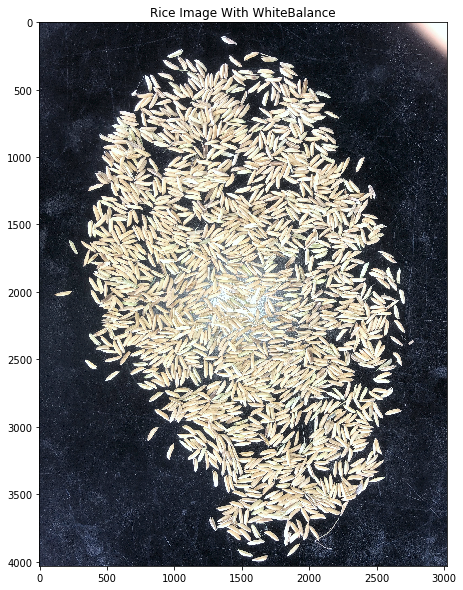

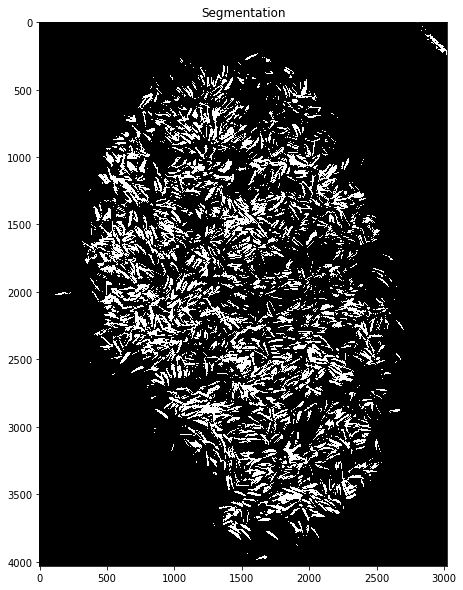

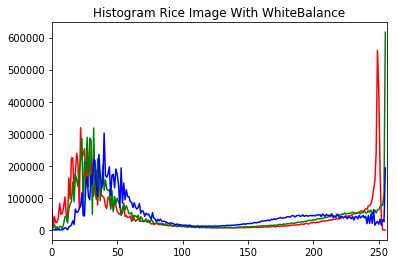

In [31]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.30.jpg")
plotImage(inputImage)

## Rice Image Black Background Flash OFF 

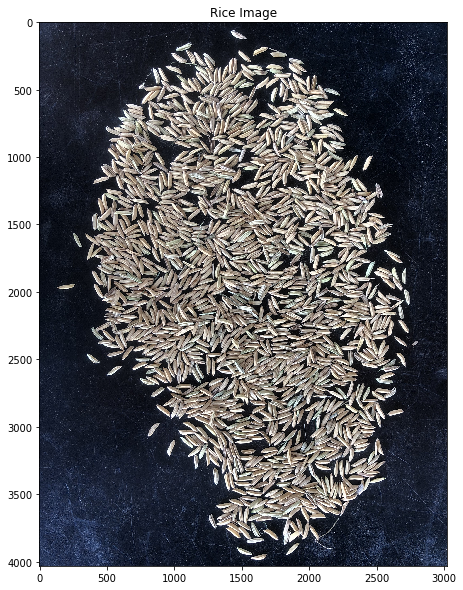

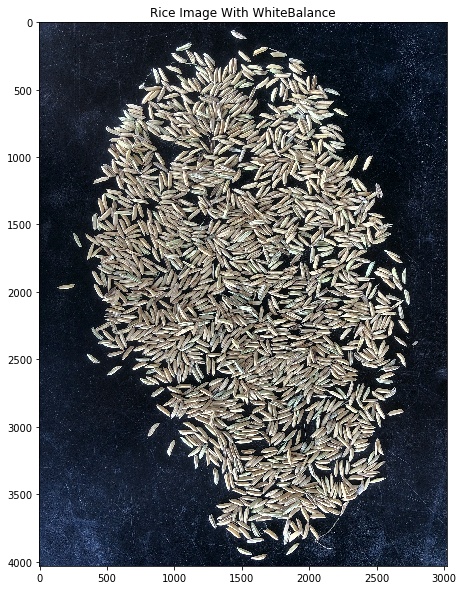

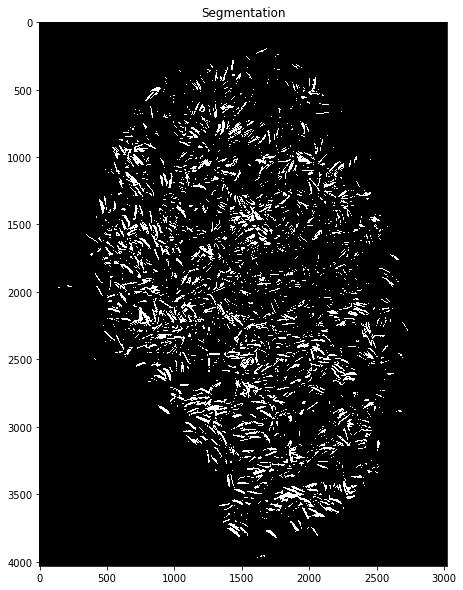

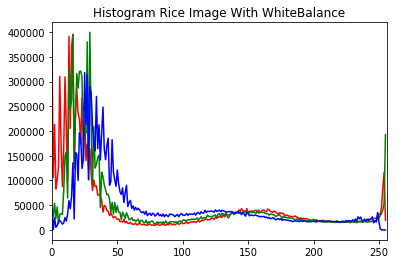

In [32]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.31.jpg")
plotImage(inputImage)

## Rice Image Black Background Flash OFF OutDoor Normal Light

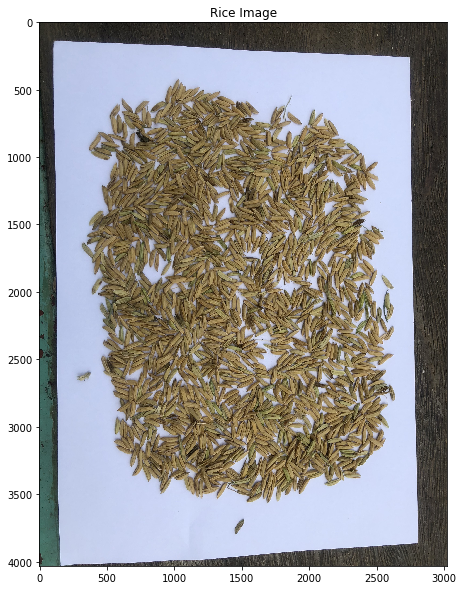

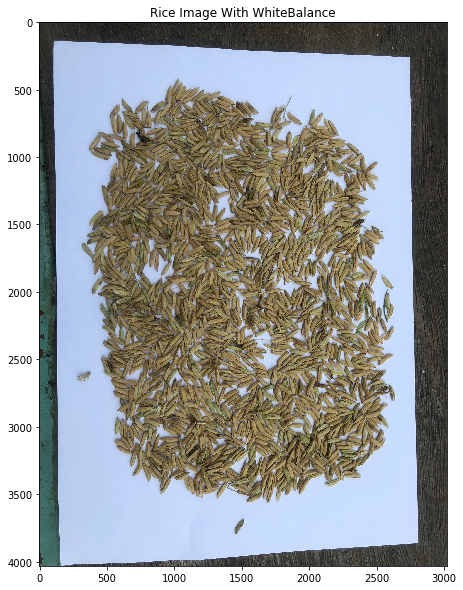

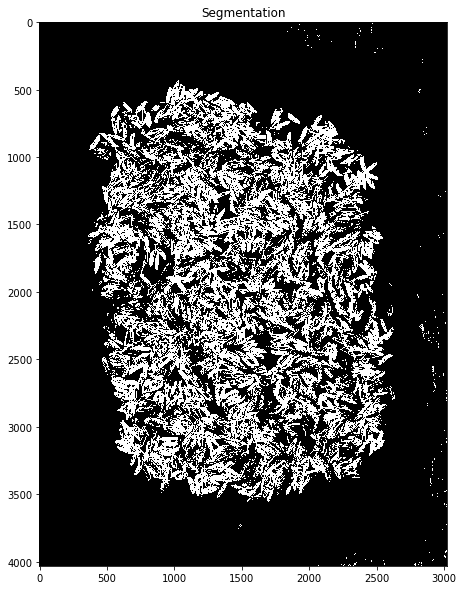

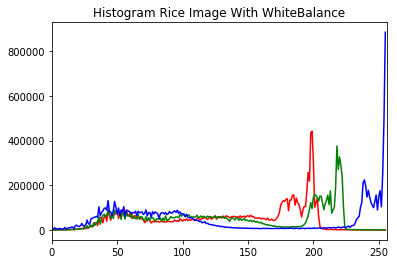

In [34]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.26.jpg")
plotImage(inputImage)

## Rice Image Black Background Flash OFF OutDoor Sun Light

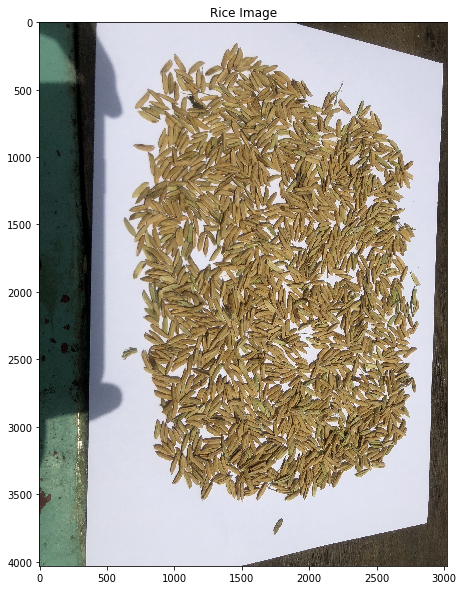

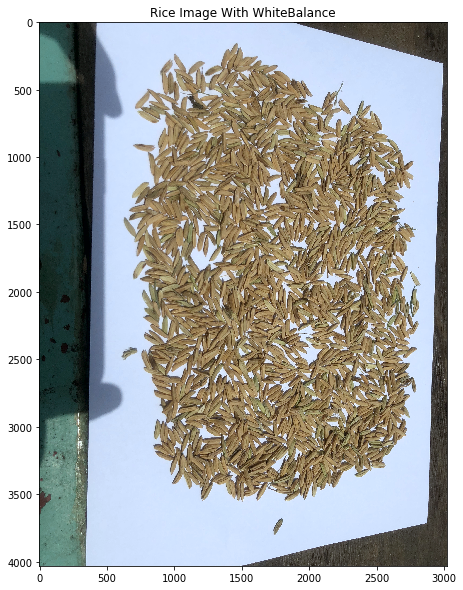

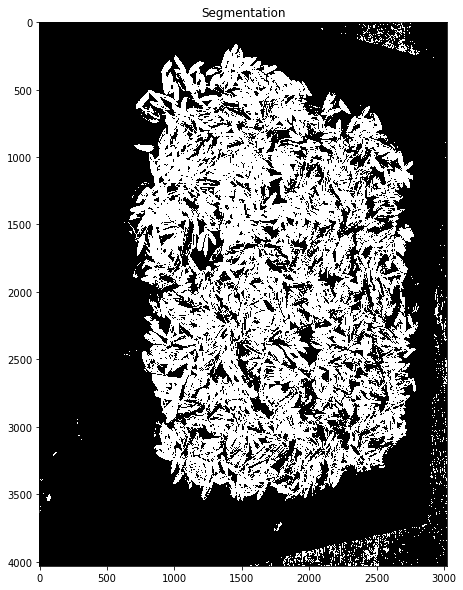

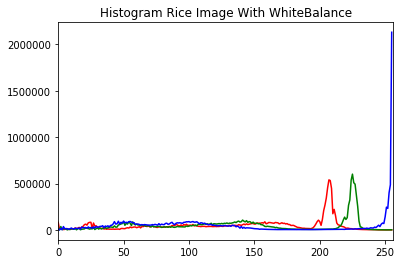

In [33]:
inputImage = cv2.imread("assets/23.09.61/23.09.61_11.27.jpg")
plotImage(inputImage)